In [1]:
import os
os.chdir("..")
print(os.getcwd())

import warnings
warnings.filterwarnings("ignore")

D:\mipt\internship\InternshipTestTask\human_segmentation


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm

import torch
from torch import nn
from torch import optim
from torch import autograd as ag

from torch.utils.data import DataLoader, Dataset

import segmentation_models_pytorch as smp

%matplotlib inlineune


In [3]:
# paths to data
TRAIN = os.path.join("data", "train")
TRAIN_MSK = os.path.join("data", "train_mask")
VAL= os.path.join("data", "valid")
VAL_MSK = os.path.join("data", "valid_mask")

In [4]:
class SegmentationData(Dataset):
    """
    Dataset class
    
    :img_path: path to images
    :mask_path: path to masks
    
    """
    
    def __init__(self, img_path, mask_path=None, size=(224, 224), preprocessing=None, augmentation=None):
        ids = [x.split(".")[0] for x in os.listdir(img_path)]
        self.img_paths = [os.path.join(img_path, x+".jpg") for x in ids]
        self.mask_path = mask_path
        if mask_path is not None:
            self.mask_paths = [os.path.join(mask_path, x+".png") for x in ids]
        self.size = size
        
        self.preprocessing = preprocessing
        self.augmentation = augmentation
        
    def __getitem__(self, i):
        # load data
        img = plt.imread(self.img_paths[i])
        img = cv2.resize(img, self.size)
        
        if self.mask_path is not None:
            mask = plt.imread(self.mask_paths[i])
            mask = cv2.resize(mask, self.size)
        
        
        # apply preprocessing if needed
        if self.preprocessing:
            img, mask = self.preprocessing(image=img, mask=mask)
    
        # apply augmentation if needed
        if self.augmentation:
            img, mask = self.augmentation(image=img, mask=mask)
          
        img = np.rollaxis(img, 2, 0)
        img = img.astype(np.float32)
        
        if self.mask_path is not None:
            mask = mask[np.newaxis, :, :].astype(np.float32)
            
        if self.mask_path is not None:
            return img, mask
        else: return img
            
    def __len__(self):
        return len(self.img_paths)

In [5]:
BASE_MODEL = "vgg11"
MODEL_WEGHTS = "imagenet"
DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"

In [6]:
train_data = SegmentationData(TRAIN, TRAIN_MSK)
val_data = SegmentationData(VAL, VAL_MSK)

train_loader = DataLoader(train_data, batch_size=16, shuffle=True, num_workers=0)
val_loader = DataLoader(val_data, batch_size=1, shuffle=False, num_workers=0)

In [7]:
criterion = smp.utils.losses.BCEDiceLoss()
metrics = [
    smp.utils.metrics.IoUMetric(),
    smp.utils.metrics.FscoreMetric()
]

In [22]:
model = smp.Unet(BASE_MODEL, MODEL_WEGHTS)

KeyError: False

In [9]:
optimizer = optim.Adam([
    {"params": model.encoder.parameters(), "lr" : 1e-6},
    {"params": model.decoder.parameters(), "lr" : 1e-4},
])

In [10]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=criterion, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

val_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=criterion, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [11]:
# train model for 40 epochs

max_score = 0

for i in range(0, 150):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = val_epoch.run(val_loader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou']:
        max_score = valid_logs['iou']
        torch.save(model, 'models/best_model_unet_vgg11.pth')
        print('Model saved!')
            
    if i == 50:
        optimizer.param_groups[1]['lr'] = 1e-5
        optimizer.param_groups[0]['lr'] = 1e-7
    
    if i == 100:
        optimizer.param_groups[1]['lr'] = 1e-6
        optimizer.param_groups[0]['lr'] = 1e-8


Epoch: 0
valid: 100%|██████████████████| 100/100 [00:05<00:00, 19.13it/s, bce_dice_loss - 1.125, iou - 0.5529, f-score - 0.6966]
Model saved!

Epoch: 1
valid: 100%|███████████████████| 100/100 [00:04<00:00, 22.55it/s, bce_dice_loss - 0.9077, iou - 0.6321, f-score - 0.76]
Model saved!

Epoch: 2
valid: 100%|█████████████████| 100/100 [00:07<00:00, 13.32it/s, bce_dice_loss - 0.7652, iou - 0.6882, f-score - 0.8024]
Model saved!

Epoch: 3
valid: 100%|██████████████████| 100/100 [00:04<00:00, 23.33it/s, bce_dice_loss - 0.655, iou - 0.7267, f-score - 0.8311]
Model saved!

Epoch: 4
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.41it/s, bce_dice_loss - 0.5451, iou - 0.7691, f-score - 0.8616]
Model saved!

Epoch: 5
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.48it/s, bce_dice_loss - 0.4648, iou - 0.7988, f-score - 0.8816]
Model saved!

Epoch: 6
valid: 100%|███████████████████| 100/100 [00:04<00:00, 23.37it/s, bce_dice_loss - 0.4067, iou - 0.824, f-score - 0.898]
Model saved!

valid: 100%|██████████████████| 100/100 [00:04<00:00, 23.66it/s, bce_dice_loss - 0.3305, iou - 0.8891, f-score - 0.937]

Epoch: 65
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.56it/s, bce_dice_loss - 0.3374, iou - 0.8886, f-score - 0.9365]

Epoch: 66
valid: 100%|██████████████████| 100/100 [00:04<00:00, 23.18it/s, bce_dice_loss - 0.3383, iou - 0.888, f-score - 0.9361]

Epoch: 67
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.67it/s, bce_dice_loss - 0.3335, iou - 0.8887, f-score - 0.9367]

Epoch: 68
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.63it/s, bce_dice_loss - 0.3387, iou - 0.8886, f-score - 0.9364]

Epoch: 69
valid: 100%|██████████████████| 100/100 [00:04<00:00, 23.72it/s, bce_dice_loss - 0.3439, iou - 0.886, f-score - 0.9353]

Epoch: 70
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.08it/s, bce_dice_loss - 0.3371, iou - 0.8883, f-score - 0.9362]

Epoch: 71
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.56it/s, bce_dice_loss - 0.3

valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.58it/s, bce_dice_loss - 0.3522, iou - 0.8865, f-score - 0.9353]

Epoch: 130
valid: 100%|██████████████████| 100/100 [00:04<00:00, 23.55it/s, bce_dice_loss - 0.3505, iou - 0.887, f-score - 0.9355]

Epoch: 131
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.63it/s, bce_dice_loss - 0.3507, iou - 0.8868, f-score - 0.9355]

Epoch: 132
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.67it/s, bce_dice_loss - 0.3469, iou - 0.8862, f-score - 0.9351]

Epoch: 133
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.11it/s, bce_dice_loss - 0.3474, iou - 0.8867, f-score - 0.9354]

Epoch: 134
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.52it/s, bce_dice_loss - 0.3525, iou - 0.8869, f-score - 0.9354]

Epoch: 135
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.65it/s, bce_dice_loss - 0.3487, iou - 0.8869, f-score - 0.9355]

Epoch: 136
valid: 100%|█████████████████| 100/100 [00:04<00:00, 23.72it/s, bce_dice_los

In [12]:
del model

In [13]:
BASE_MODEL = "se_resnext50_32x4d"
MODEL_WEGHTS = "imagenet"

In [14]:
train_data = SegmentationData(TRAIN, TRAIN_MSK)
val_data = SegmentationData(VAL, VAL_MSK)

train_loader = DataLoader(train_data, batch_size=4, shuffle=True, num_workers=0)
val_loader = DataLoader(val_data, batch_size=1, shuffle=False, num_workers=0)

In [15]:
model = smp.Unet(BASE_MODEL, MODEL_WEGHTS)

In [16]:
optimizer = optim.Adam([
    {"params": model.encoder.parameters(), "lr" : 1e-6},
    {"params": model.decoder.parameters(), "lr" : 1e-4},
])

In [17]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=criterion, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

val_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=criterion, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [18]:
max_score = 0

for i in range(0, 150):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = val_epoch.run(val_loader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou']:
        max_score = valid_logs['iou']
        torch.save(model, 'models/best_model_unet_seresnext50.pth')
        print('Model saved!')
        
    if i == 50:
        optimizer.param_groups[1]['lr'] = 1e-5
        optimizer.param_groups[0]['lr'] = 1e-7
    
    if i == 100:
        optimizer.param_groups[1]['lr'] = 1e-6
        optimizer.param_groups[0]['lr'] = 1e-8


Epoch: 0
valid: 100%|█████████████████| 100/100 [00:07<00:00, 13.74it/s, bce_dice_loss - 0.1868, iou - 0.9162, f-score - 0.9543]
Model saved!

Epoch: 1
valid: 100%|█████████████████| 100/100 [00:07<00:00, 13.78it/s, bce_dice_loss - 0.1537, iou - 0.9317, f-score - 0.9632]
Model saved!

Epoch: 2
valid: 100%|██████████████████| 100/100 [00:07<00:00, 13.51it/s, bce_dice_loss - 0.132, iou - 0.9392, f-score - 0.9673]
Model saved!

Epoch: 3
valid: 100%|█████████████████| 100/100 [00:07<00:00, 13.73it/s, bce_dice_loss - 0.1169, iou - 0.9467, f-score - 0.9718]
Model saved!

Epoch: 4
valid: 100%|█████████████████| 100/100 [00:06<00:00, 14.50it/s, bce_dice_loss - 0.1146, iou - 0.9465, f-score - 0.9714]

Epoch: 5
valid: 100%|█████████████████| 100/100 [00:06<00:00, 14.53it/s, bce_dice_loss - 0.1259, iou - 0.9425, f-score - 0.9687]

Epoch: 6
valid: 100%|█████████████████| 100/100 [00:06<00:00, 14.68it/s, bce_dice_loss - 0.1127, iou - 0.9495, f-score - 0.9735]
Model saved!

Epoch: 7
valid: 100%|███

valid: 100%|█████████████████| 100/100 [00:07<00:00, 13.78it/s, bce_dice_loss - 0.1232, iou - 0.9563, f-score - 0.9762]

Epoch: 65
valid: 100%|██████████████████| 100/100 [00:07<00:00, 13.82it/s, bce_dice_loss - 0.125, iou - 0.9557, f-score - 0.9759]

Epoch: 66
valid: 100%|█████████████████| 100/100 [00:07<00:00, 13.44it/s, bce_dice_loss - 0.1388, iou - 0.9544, f-score - 0.9749]

Epoch: 67
valid: 100%|█████████████████| 100/100 [00:07<00:00, 13.44it/s, bce_dice_loss - 0.1169, iou - 0.9577, f-score - 0.9772]

Epoch: 68
valid: 100%|█████████████████| 100/100 [00:07<00:00, 13.53it/s, bce_dice_loss - 0.1187, iou - 0.9571, f-score - 0.9769]

Epoch: 69
valid: 100%|█████████████████| 100/100 [00:07<00:00, 13.49it/s, bce_dice_loss - 0.1163, iou - 0.9578, f-score - 0.9774]

Epoch: 70
valid: 100%|██████████████████| 100/100 [00:07<00:00, 13.19it/s, bce_dice_loss - 0.122, iou - 0.9576, f-score - 0.9771]

Epoch: 71
valid: 100%|█████████████████| 100/100 [00:08<00:00, 12.47it/s, bce_dice_loss - 0.1

KeyboardInterrupt: 

In [25]:
list(smp.encoders.encoders["vgg11"])

['encoder', 'out_shapes', 'pretrained_settings', 'params']

In [1]:
import unet
import imgaug as ia
import imgaug.augmenters as iaa

In [17]:
class SegmentationData(Dataset):
    """
    Dataset class
    
    :img_path: path to images
    :mask_path: path to masks
    
    """
    
    def __init__(self, img_path, mask_path, size=(224, 224), preprocessing=None, augmentation=None):
        ids = [x.split(".")[0] for x in os.listdir(img_path)]
        self.img_paths = [os.path.join(img_path, x+".jpg") for x in ids]
        self.mask_path = mask_path
        if mask_path is not None:
            self.mask_paths = [os.path.join(mask_path, x+".png") for x in ids]
        self.size = size
        
        self.preprocessing = preprocessing
        self.augmentation = augmentation
        
    def __getitem__(self, i):
        # load data
        img = plt.imread(self.img_paths[i])
        img = cv2.resize(img, self.size)
        
        mask = plt.imread(self.mask_paths[i])
        mask = cv2.resize(mask, self.size)
        
        img = img.astype(np.float32)/255
        mask = mask[np.newaxis, :, :, ]
        mask = mask.astype(np.uint8)
        
        # apply preprocessing if needed
        if self.preprocessing:
            img, mask = self.preprocessing(image=img, mask=mask)
    
        # apply augmentation if needed
        if self.augmentation:
            img, mask = self.augmentation(image=img, segmentation_maps=mask)
          
        img = np.rollaxis(img, 2, 0)
        
        
        
        return torch.from_numpy(img.copy()), torch.from_numpy(mask.astype(np.float32))
            
    def __len__(self):
        return len(self.img_paths)

In [18]:
aug = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Flipud(0.05),
    
    iaa.Sometimes(
        0.5, 
        iaa.Crop(px=(0, 20))
    ),
    
    iaa.SomeOf(
        (0,3),
        [
            iaa.GaussianBlur(sigma=(0, 2)),
             iaa.GammaContrast(per_channel=True, gamma=(0.25,1.75)),
             iaa.LinearContrast(alpha=(0.25,1.75), per_channel=True)
        ]
    ),
    
    iaa.Sometimes(
        0.8,
        [iaa.Sometimes(
                0.3,
                iaa.OneOf([
                    iaa.ElasticTransformation(alpha=20, sigma=1),
                    iaa.ElasticTransformation(alpha=200, sigma=20)
                ])
        ),


        iaa.Sometimes(0.3, 
            iaa.Affine(
                scale={"x": (0.9, 1.1), "y": (0.8, 1.2)},
                rotate=(-20, 20),
                order=[0, 1]
            )
        )]
    )
])

In [19]:
train_data = SegmentationData(TRAIN, TRAIN_MSK, augmentation=aug)
val_data = SegmentationData(VAL, VAL_MSK)

train_loader = DataLoader(train_data, batch_size=4, shuffle=True, num_workers=0)
val_loader = DataLoader(val_data, batch_size=1, shuffle=False, num_workers=0)

In [30]:
model = unet.unet_model.UNet(3, 1)

In [21]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [22]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=criterion, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

val_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=criterion, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [23]:
max_score = 0

for i in range(0, 150):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = val_epoch.run(val_loader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou']:
        max_score = valid_logs['iou']
        torch.save(model, 'models/best_model_unet_aug.pth')
        print('Model saved!')


Epoch: 0
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.76it/s, bce_dice_loss - 0.9507, iou - 0.5712, f-score - 0.713]
Model saved!

Epoch: 1
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.74it/s, bce_dice_loss - 0.9189, iou - 0.5712, f-score - 0.713]

Epoch: 2
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.79it/s, bce_dice_loss - 0.8916, iou - 0.5712, f-score - 0.713]

Epoch: 3
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.81it/s, bce_dice_loss - 0.8731, iou - 0.5712, f-score - 0.713]

Epoch: 4
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.80it/s, bce_dice_loss - 0.8712, iou - 0.5712, f-score - 0.713]

Epoch: 5
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.80it/s, bce_dice_loss - 0.8663, iou - 0.5712, f-score - 0.713]

Epoch: 6
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.79it/s, bce_dice_loss - 0.8683, iou - 0.5712, f-score - 0.713]

Epoch: 7
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.81it/s, bc

valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.82it/s, bce_dice_loss - 0.8287, iou - 0.6009, f-score - 0.736]

Epoch: 65
valid: 100%|█████████████████| 100/100 [00:06<00:00, 14.82it/s, bce_dice_loss - 0.8284, iou - 0.6855, f-score - 0.7967]

Epoch: 66
valid: 100%|█████████████████| 100/100 [00:06<00:00, 14.90it/s, bce_dice_loss - 0.8314, iou - 0.6242, f-score - 0.7539]

Epoch: 67
valid: 100%|█████████████████| 100/100 [00:06<00:00, 14.86it/s, bce_dice_loss - 0.8284, iou - 0.7054, f-score - 0.8141]

Epoch: 68
valid: 100%|█████████████████| 100/100 [00:06<00:00, 14.89it/s, bce_dice_loss - 0.8298, iou - 0.6727, f-score - 0.7912]

Epoch: 69
valid: 100%|█████████████████| 100/100 [00:06<00:00, 14.90it/s, bce_dice_loss - 0.8255, iou - 0.7381, f-score - 0.8373]

Epoch: 70
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.92it/s, bce_dice_loss - 0.8294, iou - 0.6324, f-score - 0.761]

Epoch: 71
valid: 100%|██████████████████| 100/100 [00:06<00:00, 14.89it/s, bce_dice_loss - 0.

valid: 100%|██████████████████| 100/100 [00:08<00:00, 11.74it/s, bce_dice_loss - 0.8256, iou - 0.773, f-score - 0.8615]

Epoch: 129
valid: 100%|█████████████████| 100/100 [00:08<00:00, 12.12it/s, bce_dice_loss - 0.8271, iou - 0.7867, f-score - 0.8707]

Epoch: 130
valid: 100%|██████████████████| 100/100 [00:07<00:00, 12.86it/s, bce_dice_loss - 0.8295, iou - 0.819, f-score - 0.8927]

Epoch: 131
valid: 100%|█████████████████| 100/100 [00:07<00:00, 12.84it/s, bce_dice_loss - 0.8269, iou - 0.8186, f-score - 0.8913]

Epoch: 132
valid: 100%|██████████████████| 100/100 [00:07<00:00, 13.40it/s, bce_dice_loss - 0.8249, iou - 0.819, f-score - 0.8929]

Epoch: 133
valid: 100%|███████████████████| 100/100 [00:07<00:00, 12.71it/s, bce_dice_loss - 0.8255, iou - 0.71, f-score - 0.8188]

Epoch: 134
valid: 100%|█████████████████| 100/100 [00:07<00:00, 12.90it/s, bce_dice_loss - 0.8274, iou - 0.7909, f-score - 0.8741]

Epoch: 135
valid: 100%|█████████████████| 100/100 [00:11<00:00,  9.06it/s, bce_dice_los

In [71]:
model = torch.load('models/best_model_unet_vgg11.pth')
model = model.eval()


In [72]:
test_dataset = SegmentationData(VAL, VAL_MSK)

test_dataloader = DataLoader(test_dataset)

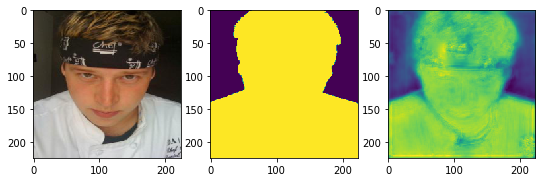

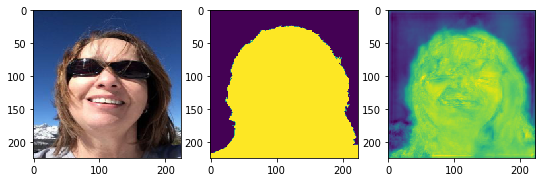

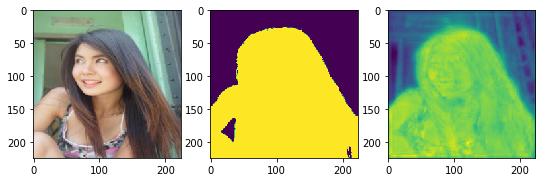

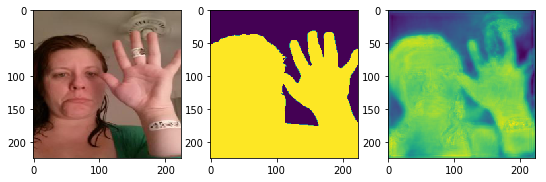

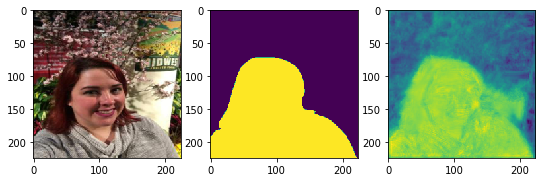

...

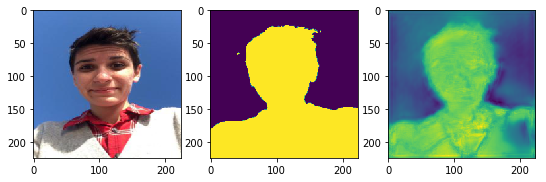

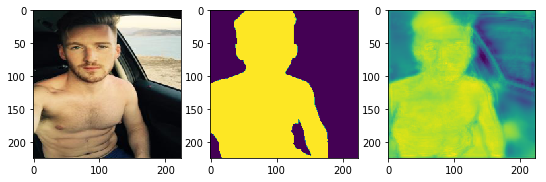

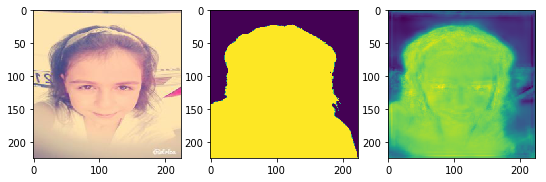

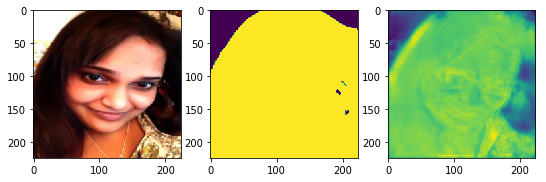

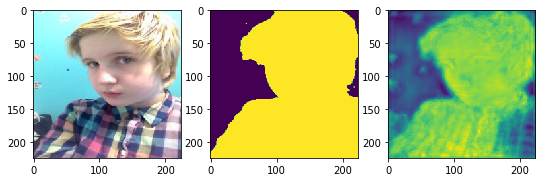

In [73]:
results = []

for img, mask in test_dataloader:
    img_ = img.to(DEVICE)
    mask_ = model.forward(img_).cpu().detach().numpy()
    plt.figure(figsize=(9,3))
    plt.subplot(131)
    plt.imshow(img[0].permute(1,2,0)/255)
    plt.subplot(132)
    plt.imshow(mask[0,0])
    plt.subplot(133)
    plt.imshow(mask_[0,0])
    plt.show()